# LidarDM + Waymax Simulator

This notebook showcases how LidarDM can extend Waymax to enable sensor-based traffic simulator. 

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/vzyrianov/LidarDM/blob/main/examples/notebook_waymax.ipynb)

#### Colab Setup

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()

!conda install -c "nvidia/label/cuda-11.8.0" cuda-toolkit -y

In [ ]:
!git clone https://github.com/vzyrianov/LidarDM.git
%cd LidarDM

# install packages
!pip install torch==2.0.0+cu117 torchvision==0.15.1+cu117 torchaudio==2.0.1+cu117 -f https://download.pytorch.org/whl/torch_stable.html
!pip install hydra-core
!pip install lightning
!pip install tensorboard
!pip install wandb
!pip install transformers
!pip install matplotlib
!pip install natsort
!pip install pykdtree
!pip install pyntcloud
!pip install pyquaternion
!pip install scikit-learn
!pip install scipy
!pip install tqdm
!pip install open3d
!pip install mediapy
!pip install opencv-python
!pip install diffusers==0.20.2
!pip install nksr==1.0.3+pt20cu117           -f https://nksr.huangjh.tech/whl/torch-2.0.0+cu117.html
!pip install torch-scatter==2.1.2+pt20cu117  -f https://data.pyg.org/whl/torch-2.0.0+cu117.html
!pip install torchmetrics==1.2.0
!pip install triton==2.0.0

In [ ]:
%cd /content/LidarDM
!pip install -v -e . # for lidardm

# download small asset bank
!wget -O assets.tar.xz "https://uofi.box.com/shared/static/ir42y4a71luia12u17bk5v0fierqrogw.xz" 
!tar -xvf assets.tar.xz

# download weights
# 1. check README.md for download instructions for waymo weight  
# 2. put weights in pretrained_models/waymo/

# download WOMD tfrecord
# 1. register with Waymo Open Motion Dataaset
# 2. in the Google Cloud, download waymo_open_dataset_motion_v_1_2_1/uncompressed/
#                 tf_example/training/training_tfexample.tfrecord-00000-of-01000
# 3. move the downloaded file into _datasets/womd

%cd /content/LidarDM

#### Environment Setup

In [1]:
import os
from glob import glob

import numpy as np
import mediapy
from tqdm import tqdm
import dataclasses

from waymax import config as _config
from waymax import dataloader

from examples.utils import get_visualization_videos

from lidardm import PROJECT_DIR
from lidardm.visualization import visualize_lidardm_map
from lidardm.core.services.sampling import *
from lidardm.waymax.waymax_compositor import WaymaxCompositor, get_lidardm_map

tfrecord = glob(os.path.join(PROJECT_DIR, '_datasets/womd/*'))[0]
config = dataclasses.replace(_config.WOD_1_1_0_TRAINING, 
                             max_num_objects=32, 
                             path=tfrecord)

2024-03-19 20:07:50.235485: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-03-19 20:07:50.652007: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2024-03-19 20:07:50.652066: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2024-03-19 20:07:50.652069: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed proper

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


03-19 20:07:53 (o3d.py:20) [WARNING] Customized build of Open3D is not detected, to resolve this you can do:
(recommended, using customized Open3D that enables view sync, animation, ...) 

pip install python-pycg[full] -f https://pycg.s3.ap-northeast-1.amazonaws.com/packages/index.html

 


#### Getting a Waymax Scenario + Map Viz

In [2]:
# get scenario
data_iter = dataloader.simulator_state_generator(config=config)
seed = 68 # change this to get different scenario
for _ in range(seed): 
    scenario = next(data_iter)

# visualize the maps
maps = []
state = scenario
for _ in tqdm(range(state.remaining_timesteps+1), desc="Getting map sequence"):
  lidardm_map = get_lidardm_map(state)
  maps.append(visualize_lidardm_map(lidardm_map))
  state = state.replace(timestep=state.timestep+1)
mediapy.show_video(maps, fps=10, height=400)

2024-03-19 20:07:53.464722: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcusolver.so.11'; dlerror: libcusolver.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/hche/miniconda3/envs/waymo/lib/python3.10/site-packages/cv2/../../lib64:
2024-03-19 20:07:53.464798: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1934] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Getting map sequence: 100%|██████████| 91/91 [00:04<00:00, 19.28it/s]


## LidarDM's Waymax Compositor

If you are running this notebook via SSH, it is likely that Open3D headless rendering won't work. set `USING_SSH = True` for (not-as-pretty-but-working) visualization

In [3]:
USING_SSH = False

compositor = WaymaxCompositor(scenario=scenario)
videos = get_visualization_videos(compositor, waymax=True, ssh=USING_SSH)
mediapy.show_videos(videos, fps=10, height=400)

Generating scene:   0%|          | 0/1 [00:00<?, ?it/s]/home/hche/miniconda3/envs/waymo/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Generating scene: 100%|██████████| 1/1 [01:14<00:00, 74.34s/it]


Successfully loaded model backbone weights
Successfully loaded model decoder weights
Successfully loaded model head weights
True
[Open3D INFO] EGL headless mode enabled.
FEngine (64 bits) created at 0x88726bd0 (threading is enabled)
EGL(1.5)
OpenGL(4.6)


Grabbing viz: 100%|██████████| 91/91 [03:04<00:00,  2.03s/it]


## Simple Hard-Coded Simulator

In [4]:
from lidardm.waymax.waymax_agent import WaymaxSimpleSimulator

simulator = WaymaxSimpleSimulator(scenario)

#### Hard code Trajectory

Here we will hardcode a pre-defined path for the ego-vehilce to follow. We will use the path generator by [PythonRobotics](https://github.com/AtsushiSakai/PythonRobotics) with the function `generate_path`. Modify the parameters of the get_path follow the instruction below (but also make sure to tweak and visualize with `visualize_chosen_traj`) 

| Command | Rough parameters (dest_x, dest_y, dest_yaw) |
| --- | --- | 
| "straight'     | `generate_path([5, 0 , 0])` |
| "left lane'    | `generate_path([5, 5, 0])` |
| "right lane'   | `generate_path([5, -5, 0])` |
| "turn left'    | `generate_path([5, 5, np.pi / 2 ])` |
| "turn right'   | `generate_path([5, -5, -np.pi / 2])` |
| "left u-turn'  | `generate_path([0, 10, np.pi])` |
| "right u-turn' | `generate_path([0, -10, -np.pi])` |


path is ok cost is:0.06789979201761488
find good path
finish path generation


""

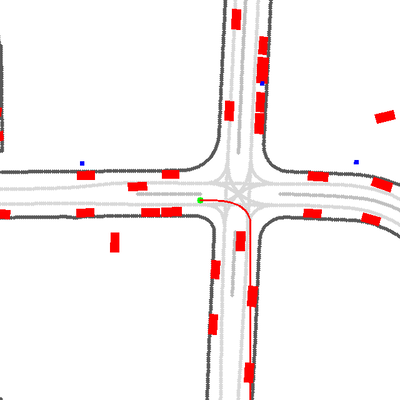

In [5]:
target_x, target_y, target_yaw = 12, -5, -np.pi/2 # left u_turn
traj = simulator.generate_path(target_x, target_y, target_yaw)
traj = simulator.sample_sequence_speed(traj, s_vel=10, e_vel=3, stop_middle_sec=0)
traj = simulator.pad_sequence(traj, target_yaw=target_yaw, speed=10)

mediapy.show_image(simulator.visualize_chosen_traj(traj), height=400)

Once we are happy with the trajectory, we can go ahead and simulate the behavior of the scene

In [6]:
sim_scenario = simulator.simulate_chosen_traj(traj)
mediapy.show_video(simulator.visualize_sim_scenario(sim_scenario), fps=10, height=400)

Simulating: 100%|██████████| 80/80 [00:10<00:00,  7.50it/s]


In [7]:
sim_compositor = WaymaxCompositor(scenario=sim_scenario, use_log_traj=False)
sim_videos = get_visualization_videos(sim_compositor, waymax=True, ssh=USING_SSH)
mediapy.show_videos(sim_videos, fps=10, height=400)
  

Generating scene:   0%|          | 0/2 [01:12<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 972.00 MiB (GPU 0; 7.75 GiB total capacity; 6.58 GiB already allocated; 821.94 MiB free; 6.71 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

: 